# ChatGPT Testing

## Initializing

In [65]:
# Install openai
!pip install openai

In [66]:
# Install tabulate
!pip install tabulate

In [67]:
# Install package for progress display
!pip install tqdm

In [68]:
# Install package for random sentences
!pip install essential-generators

In [69]:
# Install package for random names
!pip install names

In [70]:
!pip install num2words

In [71]:
# Import packages
import openai
from tabulate import tabulate
import pandas as pd
from IPython.display import display, HTML, Markdown
from tqdm.notebook import trange, tqdm
from time import sleep
from fractions import Fraction
import string
import matplotlib.pyplot as plt 
import numpy as np
import time
import math
import random
# import winsound
from num2words import num2words
import re
import names
from scipy.optimize import curve_fit


def pretty_print(df): # Pretty print the table containing multiline string
    return display(HTML(df.to_html().replace("\\n","<br>")))

In [72]:
# Set API
API_KEY = ' '
openai.api_key = API_KEY
model_id = 'gpt-3.5-turbo'

## Define Basic Functions

In [73]:
def ChatGPT_conversation(conversation):
    response = openai.ChatCompletion.create(
        model=model_id,
        messages=conversation
    )
    api_usage = response['usage']
    print('Total token consumed: {0}'.format(api_usage['total_tokens']))
#     stop means complete
#     print(response['choices'][0].finish_reason)
#     print(response['choices'][0].index)
    conversation.append({'role': response.choices[0].message.role, 'content': response.choices[0].message.content})
    return conversation

def ChatGPT_conversation_answer(conversation): # Out put only the answer
    response = openai.ChatCompletion.create(model=model_id, messages=conversation)
    return response.choices[0].message.content

In [74]:
# Define a function that can chat with ChatGPT
def start_chat():  
    question = input('User:')
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    conversation = ChatGPT_conversation(conversation)
    print('{0}: {1}\n'.format(conversation[-1]['role'].strip(), conversation[-1]['content'].strip()))
    while True:
        prompt = input('User:')
        conversation.append({'role': 'user', 'content': prompt})
        conversation = ChatGPT_conversation(conversation)
        print('{0}: {1}\n'.format(conversation[-1]['role'].strip(), conversation[-1]['content'].strip()))

In [75]:
# Ask ChatGPT a single question with question = '', return complete conversation
def single_chat(question):
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    conversation = ChatGPT_conversation(conversation)
    return conversation

# Ask ChatGPT a single question with question = '', return only the answer
def single_answer(question):
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    return ChatGPT_conversation_answer(conversation)

def single_answer_retry(question, retries = 5):
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    attempts = 0
    while attempts < retries: 
        try: 
            return openai.ChatCompletion.create(model=model_id, messages=conversation).choices[0].message.content
        except: 
            print("THERE IS AN ERROR!")
            time.sleep(3)
            attempts += 1
    if attempts == retries: 
        print("ALL RETRIES FAILED!")
        
def single_prompt_with_info(question, retries = 5):
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    attempts = 0
    while attempts < retries: 
        try: 
            response = openai.ChatCompletion.create(model=model_id, messages=conversation)
            return response['choices'][0]['message']['content'], response['choices'][0]['finish_reason'], response['usage']['completion_tokens']
        except: 
            print("THERE IS AN ERROR!")
            time.sleep(3)
            attempts += 1
    if attempts == retries: 
        print("ALL RETRIES FAILED!")
    
# Return n answers
def multi_answer(question, n_choice):
    conversation = []
    conversation.append({'role': 'user', 'content': question})
    response = openai.ChatCompletion.create(model=model_id, messages=conversation, n = n_choice)
    choice_list = []
    for i in range(n_choice):
        choice_list.append(response.choices[i].message.content)
    return choice_list

In [76]:
# A function that formats data (only works when length > 1)
def format_data(data):
    L = len(data)
    for i in range(L):
        data[i] = data[i].replace("\n", "", 2)
    data = list(map(lambda x:[x], data))
    return data

In [77]:
def qac_generate(question, answer, ntests, file_name):
    '''
    Define a function that inputs question, correct answer, and number of tests. A csv file with given name containing the answers and correctness will be generated. 
    '''
    question_list = [question]
    answer_list = []
    for i in trange(ntests, desc='Fetching Answers'):
        answer_list.append(single_answer(question))
    answer_list = [item.replace("'", "") for item in answer_list]
    answer_list = format_data(answer_list)
    qa_list = question_list + answer_list
    qa_data = pd.DataFrame(qa_list, columns=['Question and Answers'])
    print(qa_data)
    L_check = ['None']
    for i in tqdm(range(1, ntests + 1), desc='Checking Answers'):
        if qa_list[i] == answer:
            L_check.append('True')
        else:
            L_check.append('False')
    check_data = pd.DataFrame(L_check, columns=['Correctness'])
    qac_data = pd.concat([qa_data, check_data], axis=1, join='inner')
    pretty_print(qac_data)
    full_file_name = file_name + "with" + model_id + ".csv"
    qac_data.to_csv(full_file_name)

In [78]:
def Average(lst):
    return sum(lst) / len(lst)

def estimate_coef(x, y): # Perform linear regression
    # number of observations/points
    n = len(y)
    
    # mean of x and y vector
    m_x = Average(x)
    m_y = Average(y)
 
    # calculating cross-deviation and deviation about x
    y_x = []
    for i in range(n):
        y_x.append(y[i] * x[i])
    x_x = []
    for i in range(n):
        x_x.append(x[i] * x[i])
    SS_xy = sum(y_x) - n*m_y*m_x
    SS_xx = sum(x_x) - n*m_x*m_x
 
    # calculating regression coefficients
    b_1 = SS_xy / SS_xx
    
    b_0 = m_y - b_1*m_x
 
    return (b_0, b_1)

## Tests

In [79]:
# Define a function that can generate n evenly spaced options
def n_fair_options(lower_L, upper_L, n, instruct):
    '''
    Input lower limit, upper limit, number of intervals, and whether include instruction. (n maximum 26)
    '''
    interval = Fraction(upper_L - lower_L,n)
    Alphabet = list(string.ascii_uppercase)
    answer_options = ''''''
    for i in range(n):
        new_option =''''''
        new_option += Alphabet[i] + '. ' + str(lower_L + + i*interval) + ' <= x < ' + str(lower_L + (i+1)*interval) + '\n'
        answer_options += new_option
    if instruct == 'Y':
        answer_options += 'Give the answer only. No other information. '
    return answer_options

In [80]:
def bayes_noptions_auto(question, n, correct_choice, ntests, save_file, file_name):
    '''
    Define a function that inputs question, number of choices, capital letter for correct choice, number of tests, whether save the file, and file name. A csv file with given name containing the answers and correctness will be generated. 
    '''
    # Generate n options and append to question
    lower_L = 0
    upper_L = 1
    instruct = 'Y'
    options = n_fair_options(lower_L, upper_L, n, instruct)
    question += '\n' + options
    question_list = [question]
    
#     # Convert correct_choice to correct_answer
#     Alphabet = list(string.ascii_uppercase)
#     correct_index = Alphabet.index(correct_choice)
#     option_list = options.splitlines()
#     correct_answer = option_list[correct_index]
    
    # Fetching answers
    answer_list = []
    for i in trange(ntests, desc='Fetching Answers'):
        answer_list.append(single_answer(question))
#     answer_list = [item.replace("'", "") for item in answer_list]
    answer_list = format_data(answer_list)
    qa_list = question_list + answer_list
    qa_data = pd.DataFrame(qa_list,columns=['Question and Answers'])
#     print(qa_data)
    
    # Cheching answers
    L_check = ['None']
    for i in range(1, ntests + 1):
        if correct_choice in qa_list[i][0]:
            L_check.append('True')
        else:
            L_check.append('False')
    check_data = pd.DataFrame(L_check, columns=['Correctness'])
    
    # Join data and save
    qac_data = pd.concat([qa_data, check_data], axis=1, join='inner')
    pretty_print(qac_data)
    if save_file == 'Y':
        full_file_name = file_name + "_with_" + model_id + ".csv"
        qac_data.to_csv(full_file_name)

In [81]:
# Create csv files with different n
question = '''P(X = H) = 1/3
P(X = T) = 2/3
P(Y = T | X = H) = 1/4
P(Y = H | X = T) = 1/4 
P(X = T | Y = H) = x
What is the value of x?
Choose an appropriate answer from the following options. '''

def bayes_eg1_auto(lower_n, upper_n, ntests, save_files):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        Alphabet = list(string.ascii_uppercase)
        for j in range(n):
            if 0 + Fraction(1,n)*j <= Fraction(1,3) and Fraction(1,3) < 0 + Fraction(1,n)*(j+1):
                correct_index = j
        correct_choice = Alphabet[correct_index]
        file_name = 'bayes_' + str(n) + '_options'
        bayes_noptions_auto(question, n, correct_choice, ntests, save_file, file_name)
        
lower_n = 2
upper_n = 20
ntests = 100
# bayes_eg1_auto(lower_n, upper_n, ntests, 'Y')

In [82]:
def bayes_eg1_auto_new(lower_n, upper_n, ntests, save_files):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        Alphabet = list(string.ascii_uppercase)
        for j in range(n):
            if 0 + Fraction(1,n)*j <= Fraction(1,3) and Fraction(1,3) < 0 + Fraction(1,n)*(j+1):
                correct_index = j
        correct_choice = Alphabet[correct_index]
        file_name = 'bayes_' + str(n) + '_options_new'
        bayes_noptions_auto(question, n, correct_choice, ntests, save_file, file_name)
        
lower_n = 2
upper_n = 20
ntests = 100
# bayes_eg1_auto_new(lower_n, upper_n, ntests, 'Y')

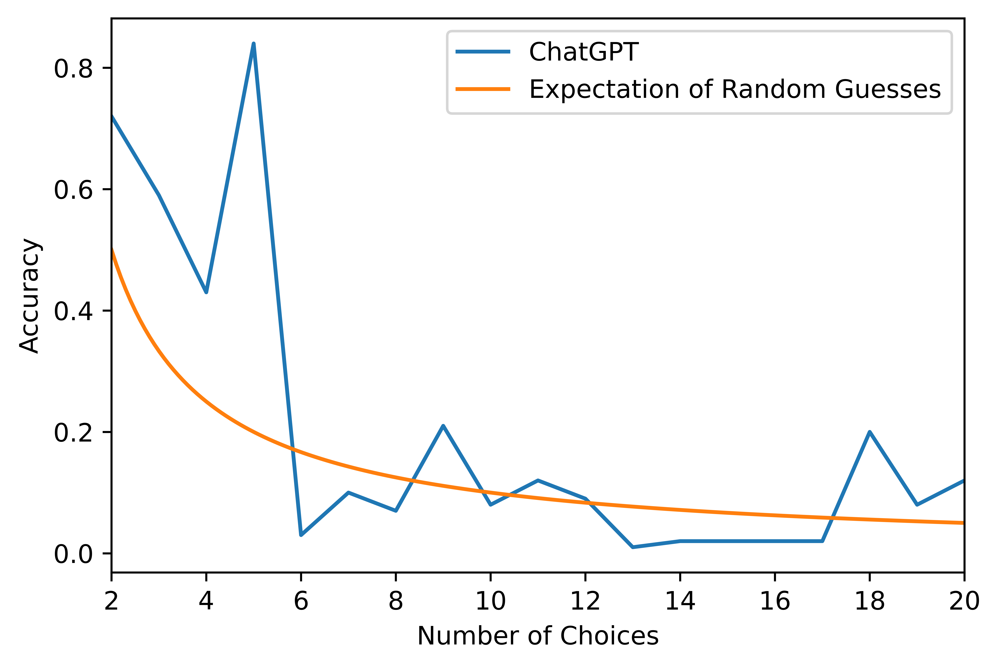

In [83]:
# Produce a figure examining the relationship between number of choices and accuracy

def bayes_accuracy_plot(lower_n, upper_n, ntests):
    accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'bayes_' + str(i) + '_options' + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        acc_for_n = Fraction(len(df[df['Correctness'] == 'True']),ntests)
        accuracy_list.append(acc_for_n)

    x_value = list(range(lower_n, upper_n+1))
    y_value = accuracy_list
    plt.plot(x_value, y_value, label='ChatGPT')
    plt.xlabel("Number of Choices")
    plt.ylabel("Accuracy")

lower_n = 2
upper_n = 20
ntests = 100
plt.figure(dpi=1200)
bayes_accuracy_plot(lower_n, upper_n, ntests)
x = np.linspace(lower_n, upper_n, (upper_n-lower_n) * 10)
plt.plot(x, 1/x, label='Expectation of Random Guesses')
plt.xlim([2,20])
plt.legend()
plt.savefig('bayes_accuracy.png')

## Relation between Percentage of Valuable Information and Accuracy

In [84]:
# Noise ratio test
# Generate text with certain signal to noise ratio 
useful_info = '''Lee Triangle's father's name is Lee Fong. Lee Fong's father's name is Lee Yuen.'''
noise_info = ''' '''
prompt_info = '''What is Lee Triangle's grandfather's name? Please give me the final answer directly, no process.'''

def char_count(counted_str):
    '''
    A function that counts the length of the string ignoring spaces.
    '''
    return sum(not chr.isspace() for chr in counted_str)

def relation_random_generator(n):
    '''
    Output a question with n pairs of father and son which asks a random person's grandfather, the correct answer, and signal to noise ratio.
    '''
    question_info = ''''''
    sentence_temp = ''''s father's name is '''
    name_list = []
    for i in range(n):
        new_name = names.get_first_name()
        while new_name in name_list:
            new_name = names.get_first_name()
        name_list.append(new_name)
    sentence_list = []
    for j in range(n - 1):
        single_sent = f'''{name_list[j]}'s father's name is {name_list[j+1]}. '''
        sentence_list.append(single_sent)
    old_snetence_list = sentence_list
    random.shuffle(sentence_list)
    for sent in sentence_list:
        question_info += sent
    random_one = random.randrange(n - 2)
    prompt_info = f'''What is {name_list[random_one]}'s grandfather's name? Please give me the name only, no process.'''
    whole_question = question_info + prompt_info
    correct_answer = f'''{name_list[random_one + 2]}'''
    essential_info = ''''''
    for m in range(2):
        single_sent = f'''{name_list[random_one + m]}'s father's name is {name_list[random_one + m +1]}. '''
        essential_info += single_sent
    essential_info +=  prompt_info
    essential_info_char = char_count(essential_info)
    total_char = char_count(whole_question)
    noise_info_char = total_char - essential_info_char
    sn_ratio = essential_info_char / total_char
    return whole_question, correct_answer, sn_ratio, essential_info

def relation_eg1_auto(lower_n, upper_n, ntests, ntests_single):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        # Fetching answers and checking answers
        question_list = []
        answer_list = []
        L_check = []
        ratio_list = []
        essential_info_list = []
        num_choices_list = []
        for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
            question, correct_answer, sn_ratio, essential_info = relation_random_generator(n)
            for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                question_list.append(question)
                answer = single_answer_retry(question)
                answer_list.append(answer)
                if correct_answer in answer:
                    L_check.append('True')
                else:
                    L_check.append('False')
                ratio_list.append(sn_ratio)
                essential_info_list.append(essential_info)
                num_choices_list.append(n)
        # Join data and save
        qacr_data = pd.DataFrame(list(zip(question_list, answer_list, L_check, ratio_list, essential_info_list, num_choices_list)),columns =['Question', 'Answer', 'Correctness', 'Signal to noise ratio', 'Essential information', 'Number of Choices'])
        pretty_print(qacr_data)
        file_name = 'relation_' + str(n)
        full_file_name = file_name + "_with_" + model_id + ".csv"
        qacr_data.to_csv(full_file_name)
            

lower_n = 3
upper_n = 90
ntests = 20
ntests_single = 5
# relation_eg1_auto(lower_n, upper_n, ntests, ntests_single)
# winsound.MessageBeep()

The power regression result is 0.62222129728379x^(-0.46124472242708087).
The exponential fit result is 1.0869926861324715e^(-0.18245916763975734x) + 0.0730667265664857.


/tmp/ipykernel_116/1234621712.py:64: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-b * x) + c


0.007859133307018885
0.004978507815433619


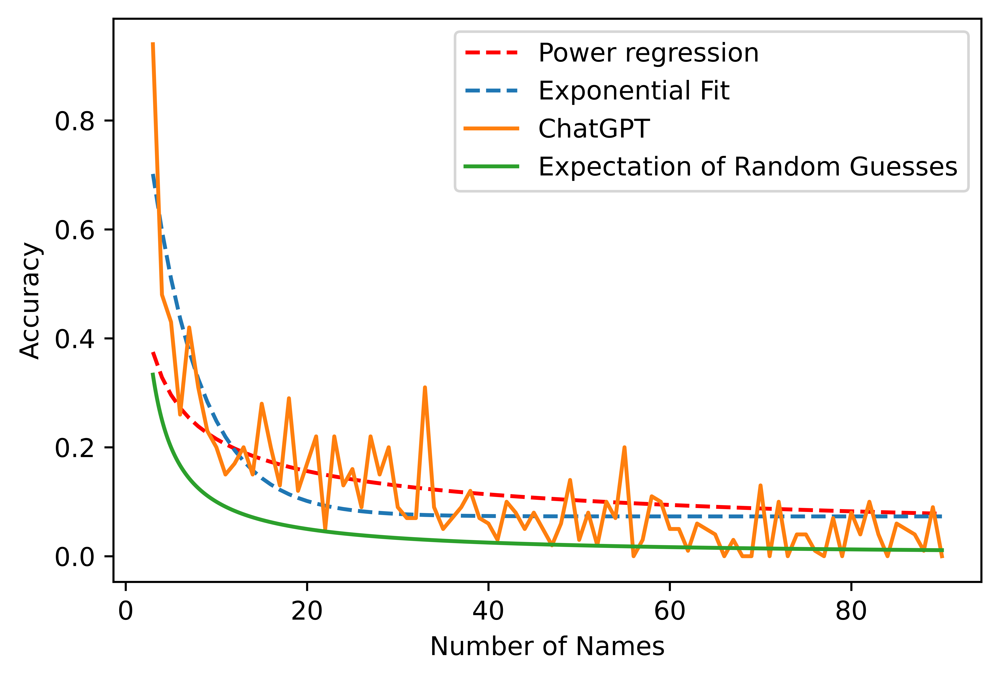

In [85]:
# Produce a figure examining the relationship between n and accuracy

plt.figure(dpi=1200)

def relation_accuracy_plot(lower_n, upper_n, ntests):
    accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'relation_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = Fraction(cat_df.value_counts()[True], ntests)
        accuracy_list.append(acc_for_n)

    x_value = list(range(lower_n, upper_n+1))
    y_value = accuracy_list
    plt.plot(x_value, y_value, label='ChatGPT')
    plt.xlabel("Number of Names")
    plt.ylabel("Accuracy")

lower_n = 3
upper_n = 90
n_total_tests = ntests * ntests_single    
    
def relation_read(lower_n, upper_n, ntests):
    accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'relation_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = (cat_df.value_counts()[True] / ntests)
        accuracy_list.append(acc_for_n)
    x_value = list(range(lower_n, upper_n+1))
    y_value = accuracy_list

    return x_value, y_value


x_value, y_value = relation_read(lower_n, upper_n, n_total_tests)

x_value_log = []
for i in x_value:
    x_value_log.append(math.log(i))
y_value_log = []
for i in y_value:
    if i ==0:
        y_value_log.append(0)
    else:
        y_value_log.append(math.log(i))
    
            
# Performing power regression   
power_regression_model = np.polyfit(x_value_log, y_value_log,1)
power_regression_power = power_regression_model[0]
power_regression_constant = math.e**(power_regression_model[1])
print(f'The power regression result is {power_regression_constant}x^({power_regression_power}).')
x_pow_reg = np.linspace(lower_n, upper_n, (upper_n - lower_n) * 100)
y_pow_reg = power_regression_constant * x_value ** power_regression_power
plt.plot(x_value, y_pow_reg, c = 'r', linestyle='dashed', label='Power regression') # Plot the power regression result    
    
# Performing exponentional regression
def func(x, a, b, c):
    return a * np.exp(-b * x) + c
popt, pcov = curve_fit(func, x_value, y_value)
a, b, c = popt

predicted_y = []
for i in x_value:
    predicted_y.append(func(i, a, b, c))

plt.plot(x_value, predicted_y, linestyle='dashed', label='Exponential Fit')
print(f'The exponential fit result is {a}e^({-b}x) + {c}.')

relation_accuracy_plot(lower_n, upper_n, n_total_tests)
x = np.linspace(lower_n, upper_n, (upper_n-lower_n) * 10)
plt.plot(x, 1/x, label='Expectation of Random Guesses')
# plt.plot(x, 2/x, label='2/n')
plt.legend()
# plt.title("Relation between number of names in question and accuracy")
plt.savefig('relation_accuracy.png')


# Compute residuals
power_summation = 0
for i in range(len(x_value)):  #looping through each element of the list
    power_difference = y_value[i] - y_pow_reg[i]  #finding the difference between observed and predicted value
    power_squared_difference = power_difference**2  #taking square of the differene 
    power_summation += power_squared_difference  #taking a sum of all the differences
power_MSE = power_summation/len(x_value)  #dividing summation by total values to obtain average

exp_summation = 0
for i in range(len(x_value)):  #looping through each element of the list
    exp_difference = y_value[i] - predicted_y[i]  #finding the difference between observed and predicted value
    exp_squared_difference = exp_difference**2  #taking square of the differene 
    exp_summation += exp_squared_difference  #taking a sum of all the differences
exp_MSE = exp_summation/len(x_value)  #dividing summation by total values to obtain average

print(power_MSE)
print(exp_MSE)

Text(0.5, 1.0, 'Scatter plot of signal to noise ratio and accuracy')

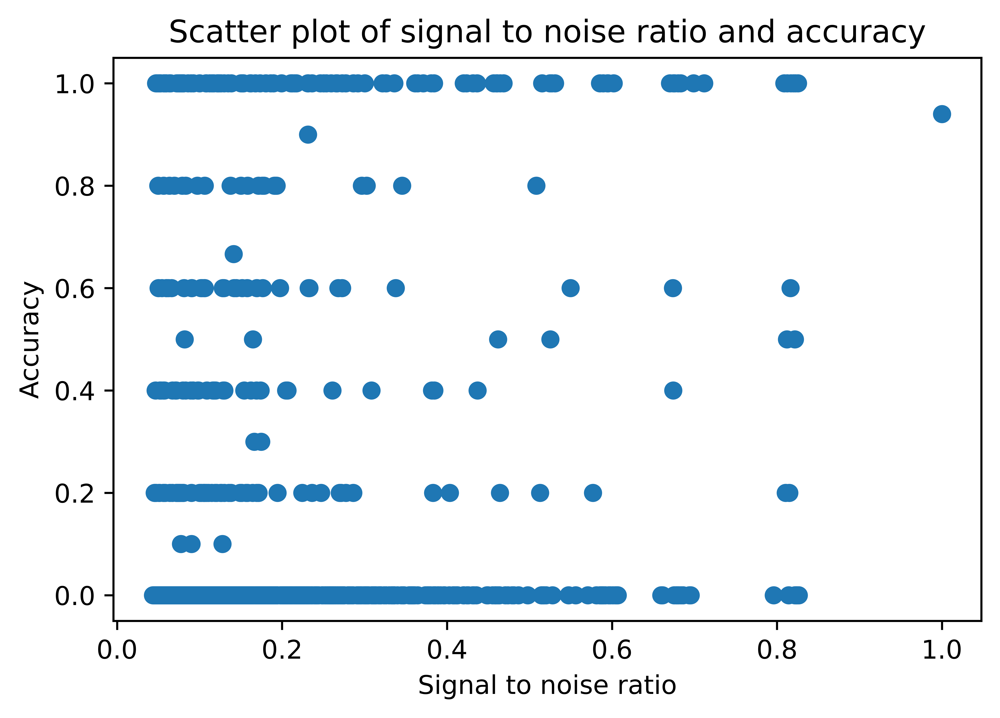

In [86]:
# Combine dataframse

plt.figure(dpi=1200)

combined_df = pd.DataFrame()
for i in range(lower_n, upper_n+1):    
    file_name = 'relation_' + str(i) + "_with_" + model_id + ".csv"
    df = pd.read_csv(file_name)
    combined_df = pd.concat([combined_df, df], ignore_index=True, sort=False)

combined_df.to_csv('all_relation_result.csv')

df = pd.read_csv('all_relation_result.csv')

# Create a list including all posiible sn value
all_sn_with_duplicate = df['Signal to noise ratio'].tolist()
all_sn = list( dict.fromkeys(all_sn_with_duplicate) )

ordered_sn_list = []
accuracy_sn_list = []
for i in range(len(all_sn)):
    a_sn = all_sn[i]
    ordered_sn_list.append(a_sn)
    df_part = df.loc[df['Signal to noise ratio'] == a_sn]
    categories = [True, False]
    cat_df = pd.Categorical(df_part['Correctness'], categories=categories)
    accuracy_sn = Fraction(cat_df.value_counts()[True], len(df_part))
    accuracy_sn_list.append(accuracy_sn)

# test_df = pd.DataFrame({'SN' : ordered_sn_list, 'AC' : accuracy_sn_list})
# test_df.to_csv('sn_accuracy.csv')
# pretty_print(test_df)

plt.scatter(ordered_sn_list, accuracy_sn_list)
plt.xlabel("Signal to noise ratio")
plt.ylabel("Accuracy")
plt.title("Scatter plot of signal to noise ratio and accuracy")
# plt.show()

[0.025, 0.07500000000000001, 0.125, 0.175, 0.225, 0.275, 0.32499999999999996, 0.375, 0.42500000000000004, 0.475, 0.525, 0.575, 0.625, 0.675, 0.725, 0.775, 0.825, 0.975]
[0.042105263157894736, 0.05070093457943925, 0.09757785467128027, 0.19034482758620688, 0.15681818181818183, 0.22181818181818183, 0.15714285714285714, 0.1935483870967742, 0.20909090909090908, 0.3263157894736842, 0.4666666666666667, 0.2625, 0.2, 0.4, 1.0, 0.0, 0.5052631578947369, 0.94]
The linear regression result is y = 0.6849840073469305x + -0.010943102736000942.


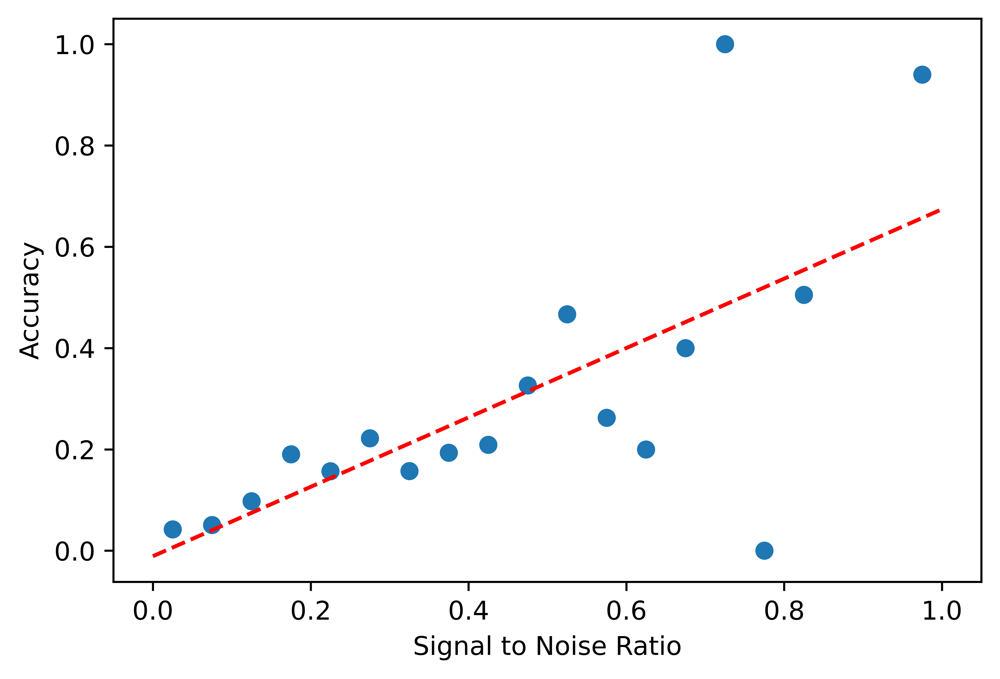

In [87]:
# Plotting the accuracy in intervals

plt.figure(dpi=1200)

divide_n_parts = 20 # Number of intervals between 0-1

# Converting the raw data to accuracy in each interval
sn_interval = []
accuracy_interval = []
for i in range(divide_n_parts):
    df_part = df.loc[(df['Signal to noise ratio'] > (1/divide_n_parts)*i)&(df['Signal to noise ratio'] <= (1/divide_n_parts)*(i+1))]
    categories = [True, False]
    cat_df = pd.Categorical(df_part['Correctness'], categories=categories)
    if len(df_part) == 0:
        continue
    else:
        sn_interval.append(1/2 * (round((1/divide_n_parts)*i, 2) + round((1/divide_n_parts)*(i+1), 2)))
        accuracy_sn = (cat_df.value_counts()[True] / len(df_part))
        accuracy_interval.append(accuracy_sn)

print(sn_interval)
print(accuracy_interval)

# Performing linear regression   
relation_model = np.polyfit(sn_interval,accuracy_interval,1)
# relation_model = np.polyfit(sn_interval,accuracy_interval,3)
print(f'The linear regression result is y = {relation_model[0]}x + {relation_model[1]}.')
relation_predict = np.poly1d(relation_model)
x_lin_reg = np.linspace(0, 1, 100)
y_lin_reg = relation_predict(x_lin_reg)
plt.plot(x_lin_reg, y_lin_reg, c = 'r', linestyle='dashed', label='Linear regression') # Plot the linear regression result  

plt.scatter(sn_interval, accuracy_interval) # Plot the original data
plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Accuracy")
# plt.title("Relation between signal to noise ratio and accuracy")
plt.savefig('relation_signal_noise_ratio.png')
plt.show() 

In [88]:
# Relation between number of choices and signal to noise ratio

plt.figure(dpi=1200)

def sn_read(lower_n, upper_n):
    num_list = []
    sn_mean_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'relation_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        sn_mean = df['Signal to noise ratio'].mean()
        sn_mean_list.append(sn_mean)
        num_list.append(i)
    return num_list, sn_mean_list

x_value, y_value = sn_read(lower_n, upper_n)

# plt.plot(x_value, y_value, c = 'r', linestyle='dashed', label='Linear regression')
# plt.xlabel("Number of Choices")
# plt.ylabel("Mean signal to noise ratio")

<Figure size 7200x4800 with 0 Axes>

## Time and Space complexity tests

In [89]:
# Time complexity O(N)

def findWholeWord(w): # e.g. findWholeWord('seek')('those who seek shall find') gives matching object type
    return re.compile(r'\b({0})\b'.format(w), flags=re.IGNORECASE).search

# Palindrome problem

def id_generator(size=6, chars=string.ascii_uppercase + string.digits):
    return ''.join(random.choice(chars) for _ in range(size))

def generate_palindrome(length):
    if length % 2 == 0:
        half_length = length // 2
        half_string = id_generator(half_length)
        reversed_half_string = half_string [::-1]
        palindrome = half_string + reversed_half_string
    else:
        half_length = length // 2
        half_string = id_generator(half_length)
        reversed_half_string = half_string [::-1]
        palindrome = half_string + id_generator(1) + reversed_half_string
    return palindrome

def generate_non_palindrome(length):
    palindrome = 'aba'
    while palindrome == palindrome [::-1]:
        palindrome = id_generator(length)
    return palindrome

def palindrome_check(string):
    if string == string [::-1]:
        result = 'Yes'
    else:
        result = 'No'
    return result

# max_length = 200
# answer_list = []
# string_list = []
# for i in trange(1, max_length + 1):
#     tested_string = generate_palindrome(i)
#     string_list.append(tested_string)
#     answer_list.append(single_answer(f'''Is {tested_string} a palindrome? Give the answer Yes or No only. '''))
# print(answer_list)


def palindrome_auto(lower_n, upper_n, ntests, ntests_single):
        for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
            n = i
            # Fetching answers and checking answers
            question_list = []
            answer_list = []
            correct_answer_list = []
            L_check = []
            for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
                if j < ntests/2:
                    question, correct_answer = f'''Is {generate_palindrome(i)} a palindrome? Give the answer Yes or No only. ''', 'Yes'
                if j >= ntests/2:
                    question, correct_answer = f'''Is {generate_non_palindrome(i)} a palindrome? Give the answer Yes or No only. ''', 'No'
                for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                    question_list.append(question)
                    answer = single_answer_retry(question)
                    answer_list.append(answer)
                    correct_answer_list.append(correct_answer)
                    if findWholeWord(correct_answer)(answer) == None:
                        L_check.append('False')
                    else:
                        L_check.append('True')
            # Join data and save
            qacr_data = pd.DataFrame(list(zip(question_list, answer_list, correct_answer_list, L_check)),columns =['Question', 'Answer', 'Correct Answer', 'Correctness'])
            pretty_print(qacr_data)
            file_name = 'palindrome_problem_' + str(n) + '_with_' + model_id + '.csv'
            qacr_data.to_csv(file_name)
        
lower_n = 21
upper_n = 30
ntests = 10
ntests_single = 5
# palindrome_auto(lower_n, upper_n, ntests, ntests_single)

/tmp/ipykernel_116/2967257236.py:47: DeprecationWarning: Fraction.__float__ returned non-float (type numpy.float64).  The ability to return an instance of a strict subclass of float is deprecated, and may be removed in a future version of Python.
  y_value_log.append(math.log(i))


The power regression result is 0.6434934858141911x^(0.03410720935808385).


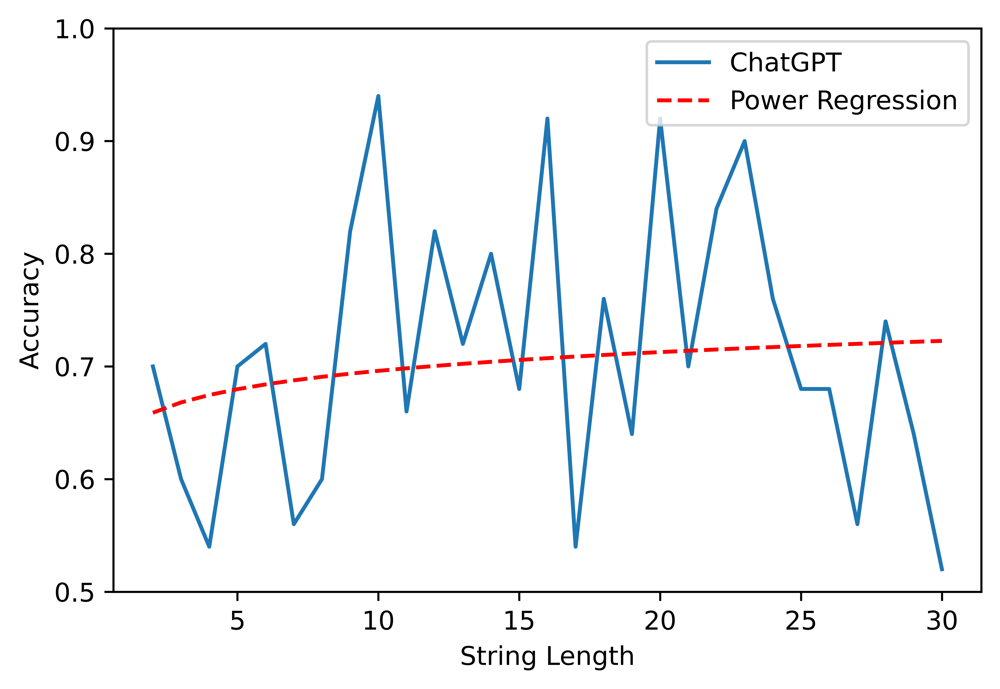

In [90]:
# Produce a figure examining the relationship between n and accuracy

plt.figure(dpi=1200)

lower_n = 2
upper_n = 30
n_total_tests = ntests * ntests_single

def palindrome_accuracy_plot(lower_n, upper_n, ntests):
    accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'palindrome_problem_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = Fraction(cat_df.value_counts()[True], n_total_tests)
        accuracy_list.append(acc_for_n)

    x_value = list(range(lower_n, upper_n+1))
#     plt.figure(figsize=(12,8))
    plt.plot(x_value, accuracy_list, label='ChatGPT')
    plt.xlabel("String Length")
    plt.ylabel("Accuracy")
    plt.legend()   

def palindrome_regression_plot(lower_n, upper_n, ntests):
    accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'palindrome_problem_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = Fraction(cat_df.value_counts()[True], ntests)
        accuracy_list.append(acc_for_n)

    x_value = list(range(lower_n, upper_n+1))
    y_value = accuracy_list
    
    x_value_log = []
    for i in x_value:
        x_value_log.append(math.log(i))
    y_value_log = []
    for i in y_value:
        if i ==0:
            y_value_log.append(0)
        else:
            y_value_log.append(math.log(i))

    # Performing power regression
    power_regression_model = np.polyfit(x_value_log, y_value_log,1)
    power_regression_power = power_regression_model[0]
    power_regression_constant = math.e**(power_regression_model[1])
    print(f'The power regression result is {power_regression_constant}x^({power_regression_power}).')
    x_pow_reg = np.linspace(lower_n, upper_n, (upper_n - lower_n) * 100)
    y_pow_reg = power_regression_constant * x_value ** power_regression_power
    plt.plot(x_value, y_pow_reg, c = 'r', linestyle='dashed', label='Power Regression') # Plot the linear regression result    

palindrome_accuracy_plot(lower_n, upper_n, n_total_tests)
palindrome_regression_plot(lower_n, upper_n, n_total_tests)

# relation_accuracy_plot(lower_n, upper_n, n_total_tests)
x = np.linspace(lower_n, upper_n, (upper_n-lower_n) * 10)
# plt.plot(x, 1/x, label='1/n')
# plt.axhline(y = 0.5, linestyle = '-')
plt.ylim([0.5,1])
plt.legend()
# plt.title("Palindrome Problem Accuracy")
plt.savefig('Palindrome Problem Accuracy.png')

In [91]:
# Palindrome problem using draft length for time

def palindrome_auto_draft(lower_n, upper_n, ntests, ntests_single):
        for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
            n = i
            # Fetching answers and checking answers
            question_list = []
            word_list = []
            answer_list = []
            answer_char_count = []
            correct_answer_list = []
            L_check = []
            for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
                if j < ntests/2:
                    word = generate_palindrome(i)
                    question, correct_answer = f'''Is {word} a palindrome? Give the answer Yes or No and list the steps that lead you to this conclusion. ''', 'Yes'
                if j >= ntests/2:
                    word = generate_non_palindrome(i)
                    question, correct_answer = f'''Is {word} a palindrome? Give the answer Yes or No and list the steps that lead you to this conclusion. ''', 'No'
                for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                    word_list.append(word)
                    question_list.append(question)
                    answer = single_answer_retry(question)
                    answer_list.append(answer)
                    correct_answer_list.append(correct_answer)
                    if findWholeWord(correct_answer)(answer) == None:
                        L_check.append('False')
                    else:
                        L_check.append('True')
                    answer_char_count.append(len(answer.split()))
            # Join data and save
            qacr_data = pd.DataFrame(list(zip(question_list, word_list, answer_list, answer_char_count, correct_answer_list, L_check)),columns =['Question', 'Word', 'Answer', 'Answer Character Count', 'Correct Answer', 'Correctness'])
            pretty_print(qacr_data)
            file_name = 'palindrome_problem_using_draft' + str(n) + '_with_' + model_id + '.csv'
            qacr_data.to_csv(file_name)
        
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
# palindrome_auto_draft(lower_n, upper_n, ntests, ntests_single)

In [92]:
def palindrome_accuracy_and_draft_plot(lower_n, upper_n, ntests, ntests_single):
    accuracy_list = []
    answer_mean_word_count = []
    for i in range(lower_n, upper_n+1):
        file_name = 'palindrome_problem_using_draft' + str(i) + '_with_' + model_id + '.csv'
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = Fraction(cat_df.value_counts()[True], ntests*ntests_single)
        accuracy_list.append(acc_for_n)
        answer_mean_word_count.append(df['Answer Character Count'].mean())
        

    x_value = list(range(lower_n, upper_n+1))
    
    # create figure and axis objects with subplots()
    fig,ax = plt.subplots(figsize=(12,7), dpi=1200)
    # make a plot
    ax.plot(x_value, accuracy_list, color="red", marker="o")
    # set x-axis label
    ax.set_xlabel("String Length", fontsize = 14)
    # set y-axis label
    ax.set_ylabel("Accuracy", color="red", fontsize=14)
    # twin object for two different y-axis on the sample plot
    ax2=ax.twinx()
    # make a plot with different y-axis using second axis object
    ax2.plot(x_value, answer_mean_word_count, color="blue", marker="o")
    ax2.set_ylabel("Answer Mean Word Count",color="blue",fontsize=14)
    
#     plt.title("Palindrome Problem Accuracy and Answer Length")
    plt.show()
    # save the plot as a file
    fig.savefig('Palindrome Problem Accuracy and Answer Length.jpg',format='jpeg',dpi=100,bbox_inches='tight')

lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
palindrome_accuracy_and_draft_plot(lower_n, upper_n, ntests, ntests_single)

## Bubble Sort Problem

In [93]:
# Define the function for bubble sort (time complexity O(N^2))
def perform_bubble_sort(alist):
    blist = alist.copy()
    cmpcount, swapcount = 0, 0
    for j in range(len(blist)):
        for i in range(1, len(blist)-j):
            cmpcount += 1
            if blist[i-1] > blist[i]:
                swapcount += 1
                blist[i-1], blist[i] = blist[i], blist[i-1]
    return swapcount, cmpcount, blist

def random_list_generator(n):
    randomlist = []
    for i in range(n):
        n = random.randint(1,100)
        while n in randomlist:
            n = random.randint(1,100)
        randomlist.append(n)
    return randomlist


def auto_bubble_sort_problem(lower_n, upper_n, ntests, ntests_single):
        for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
            n = i
            # Fetching answers and checking answers
            question_list = []
            random_generated_list_list = []
            answer_list = []
            answer_char_count = []
            correct_answer_list = []
            L_check = []
            number_of_comparison_needed = []
            for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
                generated_list = random_list_generator(n)
                question= f'''Can you perform bubble sort for the following list {generated_list}? Give the total swaps performed first, then list the steps. Please give the answer in the following format: Total swaps performed: ... Step-by-step process: 1. Compare {generated_list[0]} and {generated_list[1]}: '''
                if generated_list[0] > generated_list[1]:
                    question += '''Swap'''
                elif generated_list[0] < generated_list[1]: 
                    question += '''No swap '''
                question += '''2. ...'''
                correct_swap, correct_cmp, sorted_list = perform_bubble_sort(generated_list)
                for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                    random_generated_list_list.append(generated_list)
                    question_list.append(question)
                    answer = single_answer_retry(question)
                    answer_list.append(answer)
                    correct_answer_list.append(correct_swap)
                    if findWholeWord(f'Total swaps performed: {correct_swap}')(answer) == None:
                        L_check.append('False')
                    else:
                        L_check.append('True')
                    answer_char_count.append(len(answer.split()))
                    number_of_comparison_needed.append(correct_cmp)
            # Join data and save
            qacr_data = pd.DataFrame(list(zip(question_list, random_generated_list_list, answer_list, answer_char_count, correct_answer_list, L_check, number_of_comparison_needed)),columns =['Question', 'Random List', 'Answer', 'Answer Character Count', 'Correct Answer', 'Correctness', 'Correct Number of Comparisons'])
            pretty_print(qacr_data)
            file_name = 'Bubble_sorting_problem' + str(n) + '_with_' + model_id + '.csv'
            qacr_data.to_csv(file_name)
            
lower_n = 31
upper_n = 35
ntests = 10
ntests_single = 5
# auto_bubble_sort_problem(lower_n, upper_n, ntests, ntests_single)

In [94]:
# Test the correctness based on the given sorted list only
def auto_bubble_sort_list(lower_n, upper_n, ntests, ntests_single):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        # Fetching answers and checking answers
        question_list = []
        random_generated_list_list = []
        answer_list = []
        answer_char_count = []
        correct_answer_list = []
        L_check = []
        number_of_swaps_needed = []
        number_of_comparison_needed = []
        running_time_list = []
        finish_reason_list = []
        completion_token_list = []
        for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
            generated_list = random_list_generator(n)
            question= f'''Can you perform bubble sort for the following list {generated_list}? Give the sorted list first, then list all the steps. Please give the answer in the following format: Sorted list: [...]  Step-by-step process: 1. Compare {generated_list[0]} and {generated_list[1]}: '''
            if generated_list[0] > generated_list[1]:
                question += '''Swap '''
            elif generated_list[0] < generated_list[1]: 
                question += '''No swap '''
            question += '''2. ...'''
            correct_swap, correct_cmp, sorted_list = perform_bubble_sort(generated_list)
            for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                random_generated_list_list.append(generated_list)
                question_list.append(question)
                start_time = time.time()
                answer, finish_reason, completion_token = single_prompt_with_info(question)
                end_time = time.time()
                time_elapsed = end_time - start_time
                running_time_list.append(time_elapsed)
                answer_list.append(answer)
                correct_answer_list.append(sorted_list)
                sorted_list_no_space = f'{sorted_list}'.replace(' ', '')
                if answer.find(f'Sorted list: {sorted_list}') == -1 and answer.find(f'Sorted list: {sorted_list_no_space}') == -1:
                    L_check.append('False')
                else:
                    L_check.append('True')
                answer_char_count.append(len(answer.split()))
                number_of_swaps_needed.append(correct_swap)
                number_of_comparison_needed.append(correct_cmp)
                finish_reason_list.append(finish_reason)
                completion_token_list.append(completion_token)
        # Join data and save
        qacr_data = pd.DataFrame(list(zip(question_list, random_generated_list_list, answer_list, answer_char_count, correct_answer_list, L_check, number_of_swaps_needed, number_of_comparison_needed, running_time_list, finish_reason_list, completion_token_list)),columns =['Question', 'Random List', 'Answer', 'Answer Character Count', 'Correct Answer', 'Correctness', 'Correct Number of Swaps', 'Correct Number of Comparisons', 'Running Time', 'Finish Reason', 'Completion Token'])
        pretty_print(qacr_data)
        file_name = 'Bubble_sort_problem_with_info' + str(n) + '_with_' + model_id + '.csv'
        qacr_data.to_csv(file_name)
        
            
lower_n = 26
upper_n = 30
ntests = 10
ntests_single = 5
# auto_bubble_sort_list(lower_n, upper_n, ntests, ntests_single)

In [95]:
def bubble_sort_plot(lower_n, upper_n, ntests, ntests_single):
    accuracy_list = []
    answer_mean_word_count = []
    for i in range(lower_n, upper_n+1):
        file_name = 'Bubble_sorting_problem' + str(i) + '_with_' + model_id + '.csv'
        df = pd.read_csv(file_name)
        categories = [True, False]
        cat_df = pd.Categorical(df['Correctness'], categories=categories)
        acc_for_n = Fraction(cat_df.value_counts()[True], ntests*ntests_single)
        accuracy_list.append(acc_for_n)
        answer_mean_word_count.append(df['Answer Character Count'].mean())
        
    x_value = list(range(lower_n, upper_n+1))

    # create figure and axis objects with subplots()
    fig,ax = plt.subplots(figsize=(16,9))
    # make a plot
    ax.plot(x_value, accuracy_list, color="red", marker="o", label = 'Answer Accuracy')
    # set x-axis label
    ax.set_xlabel("n", fontsize = 14)
    # set y-axis label
    ax.set_ylabel("ChatGPT Accuracy", color="red", fontsize=14)
    # twin object for two different y-axis on the sample plot
    ax2=ax.twinx()
    # make a plot with different y-axis using second axis object
    ax2.plot(x_value, answer_mean_word_count, color="blue", marker="o", label = 'Answer Mean Word Count')
    ax2.set_ylabel("ChatGPT Answer Mean Word Count",color="blue",fontsize=14)
    
    # Exclude outliers (Only include N 3 to 21)
    x_value = x_value[0:19]
    y_value = answer_mean_word_count
    y_value = y_value[0:19]
    x_value_log = []
    for i in x_value:
        x_value_log.append(math.log(i))
    y_value_log = []
    for i in y_value:
        if i ==0:
            y_value_log.append(0)
        else:
            y_value_log.append(math.log(i))
    
    # Performing power regression
    power_regression_model = np.polyfit(x_value_log, y_value_log,1)
    power_regression_power = power_regression_model[0]
    power_regression_constant = math.e**(power_regression_model[1])
    print(f'The power regression result is {power_regression_constant}x^({power_regression_power}).')
    x_pow_reg = np.linspace(lower_n, upper_n, (upper_n - lower_n) * 100)
    y_pow_reg = power_regression_constant * x_value ** power_regression_power
    ax2.plot(x_value, y_pow_reg, c = 'orange', linestyle='dashed', label='Power regression')    
    
    ax.set_ylim([0,1])
    fig.legend()
    plt.title("Bubble Sort Problem Accuracy and Answer Length")
    plt.figtext(0.5, 0.01, r'The power regression result is {0}x^({1}).'.format(power_regression_constant, power_regression_power), fontsize=16, ha="center")
    plt.show()
    # save the plot as a file
#     fig.savefig('Bubble Sort Problem Accuracy and Answer Length.jpg',format='jpeg',dpi=100,bbox_inches='tight')

lower_n = 3
upper_n = 35
ntests = 10
ntests_single = 5
# bubble_sort_plot(lower_n, upper_n, ntests, ntests_single)

In [96]:
def sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness):
    '''
    
    '''
    if correctness == 'All':
        accuracy_list = []
        answer_mean_word_count = []
        average_response_time = []
        for i in range(lower_n, upper_n+1):
            file_name = f'{read_file_name}' + str(i) + '_with_' + model_id + '.csv'
            df = pd.read_csv(file_name)
            categories = [True, False]
            cat_df = pd.Categorical(df['Correctness'], categories=categories)
            acc_for_n = Fraction(cat_df.value_counts()[True], ntests*ntests_single)
            accuracy_list.append(acc_for_n)
            answer_mean_word_count.append(df['Answer Character Count'].mean())
            average_response_time.append(df['Running Time'].mean())

        x_value = list(range(lower_n, upper_n+1))
        regression_data = pd.DataFrame(list(zip(x_value, answer_mean_word_count)),columns =['x', 'y'])
        regression_data.to_csv(f'{save_file_name}')

        # create figure
        fig, ax = plt.subplots(figsize=(12,7), dpi=1200)
        fig.subplots_adjust(right=0.75)

        ax2=ax.twinx()
        ax3=ax.twinx()
        ax3.spines.right.set_position(("axes", 1.1))

        p1, = ax.plot(x_value, accuracy_list, color="red", marker="o", label = 'Answer Accuracy')
        p2, = ax2.plot(x_value, answer_mean_word_count, color="blue", marker="o", label = 'Answer Mean Word Count')
        p3, = ax3.plot(x_value, average_response_time, color="orange", marker="o", label = 'Average Response Time')    

        ax.set(xlim=(2, 31), ylim=(0, 1), xlabel="List Length", ylabel="Accuracy")
        ax2.set(ylabel="Answer Mean Word Count")
        ax3.set(ylabel="Average Response Time")

        ax.yaxis.label.set_color(p1.get_color())
        ax2.yaxis.label.set_color(p2.get_color())
        ax3.yaxis.label.set_color(p3.get_color())

        ax.tick_params(axis='y', colors=p1.get_color())
        ax2.tick_params(axis='y', colors=p2.get_color())
        ax3.tick_params(axis='y', colors=p3.get_color())

#         ax.legend(handles=[p1, p2, p3], loc = 'lower left')

        # Perform linear regression for accuracy
        lin_coef0, lin_coef1 = estimate_coef(x_value, accuracy_list)
        x_value_array = np.array(x_value)
        y_lin = lin_coef0 + lin_coef1 * x_value_array
        print(f'The linear regression result is {lin_coef0} + {lin_coef1}N.')
        ax.plot(x_value, y_lin, color="red", linestyle='dashed', label = 'Linear Regression')

        y_value = answer_mean_word_count

        # Power regression with costant
        def func(x,a,b,c):
            return a * x**b + c

        coeff,var=curve_fit(func,x_value,y_value, p0= power_regression_start, maxfev=8000)
        a, b, c = coeff
        print(f'The power regression with constant has result {a} N^({b}) + {c}.')
        y_pow_reg2 = func(x_value_array, a, b, c)
        r2, = ax2.plot(x_value, y_pow_reg2, c = 'purple', linestyle='dashed', label='Power Regression')

        # Performing logn regression for answer length
        y_value_array = np.array(y_value)
        polyfit_coef, polyfit_constant = np.polyfit(np.log(x_value_array), y_value_array, 1)
        y_logn = polyfit_constant + polyfit_coef * np.log(x_value_array)
        print(f'The logn regression result is {polyfit_constant} + {polyfit_coef} * log(N).')
        r3, = ax2.plot(x_value, y_logn, c = 'green', linestyle='dashdot', label='Logarithmic Regression')      

        # Performing n logn regression for answer length
        y_value_array = np.array(y_value)
        polyfit_coef, polyfit_constant = np.polyfit(np.multiply(x_value_array, np.log(x_value_array)), y_value_array, 1)
        y_nlogn = polyfit_constant + polyfit_coef * np.multiply(x_value_array, np.log(x_value_array))
        print(f'The nlogn regression result is {polyfit_constant} + {polyfit_coef} * Nlog(N).')
        r4, = ax2.plot(x_value, y_nlogn, linestyle='dashdot', label='Log Linear Regression')  

        # Evaluate the Mean Squared Error
        # For power regression with constant
        power2_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            power2_difference = y_value[i] - y_pow_reg2[i]  #finding the difference between observed and predicted value
            power2_squared_difference = power2_difference**2  #taking square of the differene 
            power2_summation += power2_squared_difference  #taking a sum of all the differences
        power2_MSE = power2_summation/len(x_value)  #dividing summation by total values to obtain average

        # For log n regression
        logn_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            logn_difference = y_value[i] - y_logn[i]  #finding the difference between observed and predicted value
            logn_squared_difference = logn_difference**2  #taking square of the differene 
            logn_summation += logn_squared_difference  #taking a sum of all the differences
        logn_MSE = logn_summation/len(x_value)  #dividing summation by total values to obtain average

        # For n log n regression
        nlogn_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            nlogn_difference = y_value[i] - y_nlogn[i]  #finding the difference between observed and predicted value
            nlogn_squared_difference = nlogn_difference**2  #taking square of the differene 
            nlogn_summation += nlogn_squared_difference  #taking a sum of all the differences
        nlogn_MSE = nlogn_summation/len(x_value)  #dividing summation by total values to obtain average

#         plt.title(f'{fig_title}')
        ax2.legend(handles = [r2, r3, r4], loc = 'lower right')
    #     plt.figtext(0.5, 0.01, r'The power regression result is {0}x^({1}).'.format(power_regression_constant, power_regression_power), fontsize=16, ha="center")
        plt.show()
        plt.savefig(f'{fig_title}.jpg',format='jpeg',dpi=100,bbox_inches='tight') # save the plot as a file
        print(f'Power regression with constant MSE = {power2_MSE}')
        print(f'logn MSE = {logn_MSE}')
        print(f'nlogn MSE = {nlogn_MSE}')
        MSE_list = [power2_MSE, logn_MSE, nlogn_MSE]
        method_list = ['Power regression with constant', 'log N regression', 'N log N regression']
        print(f'{method_list[MSE_list.index(min(MSE_list))]} gives the best estimate.')
    
    elif correctness == 'True':
        answer_mean_word_count = []
        average_response_time = []    
        for i in range(lower_n, upper_n+1):
            file_name = f'{read_file_name}' + str(i) + '_with_' + model_id + '.csv'
            df = pd.read_csv(file_name)
            # Extract info for correct answer only
            correct_df = df[df['Correctness'] == True]
            answer_mean_word_count.append(correct_df['Answer Character Count'].mean())
            average_response_time.append(correct_df['Running Time'].mean())        

        x_value = list(range(lower_n, upper_n+1))
        x_value_array = np.array(x_value)
        y_value = answer_mean_word_count
        
        # create figure
        fig, ax = plt.subplots(figsize=(12,7), dpi=1200)
        fig.subplots_adjust(right=0.75)

        ax2=ax.twinx()

        p1, = ax.plot(x_value, answer_mean_word_count, color="blue", marker="o", label = 'Answer Mean Word Count')
        p2, = ax2.plot(x_value, average_response_time, color="orange", marker="o", label = 'Average Response Time')    

        ax.set(xlim=(2, 31), xlabel="List Length", ylabel="Answer Mean Word Count")
        ax2.set(ylabel="Average Response Time")

        ax.yaxis.label.set_color(p1.get_color())
        ax2.yaxis.label.set_color(p2.get_color())

        ax.tick_params(axis='y', colors=p1.get_color())
        ax2.tick_params(axis='y', colors=p2.get_color())
#         ax.legend(handles=[p1, p2], loc = 'lower left')

        # Performing power regression for answer length    
        # Power regression with costant
        def func(x,a,b,c):
            return a * x**b + c

        coeff,var=curve_fit(func,x_value,y_value, p0= power_regression_start, maxfev=8000)
        a, b, c = coeff
        print(f'The power regression with constant has result {a} N^({b}) + {c}.')
        y_pow_reg2 = func(x_value_array, a, b, c)
        r2, = ax.plot(x_value, y_pow_reg2, c = 'purple', linestyle='dashed', label='Power Regression')

        # Performing logn regression for answer length
        y_value_array = np.array(y_value)
        polyfit_coef, polyfit_constant = np.polyfit(np.log(x_value_array), y_value_array, 1)
        y_logn = polyfit_constant + polyfit_coef * np.log(x_value_array)
        print(f'The logn regression result is {polyfit_constant} + {polyfit_coef} * log(N).')
        r3, = ax.plot(x_value, y_logn, c = 'green', linestyle='dashdot', label='Logarithmic Regression')      

        # Performing n logn regression for answer length
        y_value_array = np.array(y_value)
        polyfit_coef, polyfit_constant = np.polyfit(np.multiply(x_value_array, np.log(x_value_array)), y_value_array, 1)
        y_nlogn = polyfit_constant + polyfit_coef * np.multiply(x_value_array, np.log(x_value_array))
        print(f'The nlogn regression result is {polyfit_constant} + {polyfit_coef} * Nlog(N).')
        r4, = ax.plot(x_value, y_nlogn, linestyle='dashdot', label='Log Linear Regression')  

        # Evaluate the Mean Squared Error
        # For power regression with constant
        power2_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            power2_difference = y_value[i] - y_pow_reg2[i]  #finding the difference between observed and predicted value
            power2_squared_difference = power2_difference**2  #taking square of the differene 
            power2_summation += power2_squared_difference  #taking a sum of all the differences
        power2_MSE = power2_summation/len(x_value)  #dividing summation by total values to obtain average

        # For log n regression
        logn_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            logn_difference = y_value[i] - y_logn[i]  #finding the difference between observed and predicted value
            logn_squared_difference = logn_difference**2  #taking square of the differene 
            logn_summation += logn_squared_difference  #taking a sum of all the differences
        logn_MSE = logn_summation/len(x_value)  #dividing summation by total values to obtain average

        # For n log n regression
        nlogn_summation = 0
        for i in range(len(x_value)):  #looping through each element of the list
            nlogn_difference = y_value[i] - y_nlogn[i]  #finding the difference between observed and predicted value
            nlogn_squared_difference = nlogn_difference**2  #taking square of the differene 
            nlogn_summation += nlogn_squared_difference  #taking a sum of all the differences
        nlogn_MSE = nlogn_summation/len(x_value)  #dividing summation by total values to obtain average

#         plt.title(f'{fig_title}')
        ax2.legend(handles = [r2, r3, r4], loc = 'lower right')
    #     plt.figtext(0.5, 0.01, r'The power regression result is {0}x^({1}).'.format(power_regression_constant, power_regression_power), fontsize=16, ha="center")
        plt.show()
        plt.savefig(f'{fig_title}.jpg',format='jpeg',dpi=100,bbox_inches='tight') # save the plot as a file
        print(f'Power regression with constant MSE = {power2_MSE}')
        print(f'logn MSE = {logn_MSE}')
        print(f'nlogn MSE = {nlogn_MSE}')
        MSE_list = [power2_MSE, logn_MSE, nlogn_MSE]
        method_list = ['Power regression with constant', 'log N regression', 'N log N regression']
        print(f'{method_list[MSE_list.index(min(MSE_list))]} gives the best estimate.')

In [97]:
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
read_file_name = 'Bubble_sort_problem_with_info'
save_file_name = 'Bubble Sort Problem Regression Data.csv'
fig_title = 'Bubble Sort Problem Accuracy and Answer Length'
power_regression_start = [40, 1, -100]
correctness = 'All'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The linear regression result is 1.0076026272577998 + -0.001499726327312539N.
The power regression with constant has result 2000511.6089592082 N^(0.00017332291609503726) + -2000838.2273581997.
The logn regression result is -326.7851381789746 + 346.8820785254697 * log(N).
The nlogn regression result is 276.3662679166817 + 6.468176721565765 * Nlog(N).


Power regression with constant MSE = 7889.608245631959
logn MSE = 7889.0815555629715
nlogn MSE = 16868.78688753551
log N regression gives the best estimate.


<Figure size 432x288 with 0 Axes>

In [98]:
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
read_file_name = 'Bubble_sort_problem_with_info'
save_file_name = 'Bubble Sort Problem Regression Data for Correct Answer.csv'
fig_title = 'Bubble Sort Problem Accuracy and Answer Length for Correct Answer'
power_regression_start = [40, 1, -100]
correctness = 'True'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The power regression with constant has result 1686007.9609319388 N^(0.0002035792568113203) + -1686327.342638641.
The logn regression result is -319.5744695163628 + 343.40735289806116 * log(N).
The nlogn regression result is 278.4173114183145 + 6.385165241063514 * Nlog(N).


Power regression with constant MSE = 7771.181839013327
logn MSE = 7770.52945197457
nlogn MSE = 16782.13877680114
log N regression gives the best estimate.


<Figure size 432x288 with 0 Axes>

In [99]:
# Sort problem without specified method
def auto_sort_problem(lower_n, upper_n, ntests, ntests_single):
        for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
            n = i
            # Fetching answers and checking answers
            question_list = []
            random_generated_list_list = []
            answer_list = []
            answer_char_count = []
            for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
                generated_list = random_list_generator(n)
                question= f'''Can you sort the numbers in the following list {generated_list} in ascending order? Give the total swaps performed first, then list the steps. Please give the answer in the following format: Total swaps performed: ... Step-by-step process: ...'''
                for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                    random_generated_list_list.append(generated_list)
                    question_list.append(question)
                    answer = single_answer_retry(question)
                    answer_list.append(answer)
                    answer_char_count.append(len(answer.split()))
            # Join data and save
            qacr_data = pd.DataFrame(list(zip(question_list, random_generated_list_list, answer_list, answer_char_count)),columns =['Question', 'Random List', 'Answer', 'Answer Character Count'])
            pretty_print(qacr_data)
            file_name = 'Sorting_problem' + str(n) + '_with_' + model_id + '.csv'
            qacr_data.to_csv(file_name)

lower_n = 24
upper_n = 30
ntests = 10
ntests_single = 5
# auto_sort_problem(lower_n, upper_n, ntests, ntests_single)

In [100]:
# Test the correctness based on the given sorted list only
def auto_sort_list(lower_n, upper_n, ntests, ntests_single):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        # Fetching answers and checking answers
        question_list = []
        random_generated_list_list = []
        answer_list = []
        answer_char_count = []
        correct_answer_list = []
        L_check = []
        number_of_swaps_needed = []
        number_of_comparison_needed = []
        running_time_list = []
        finish_reason_list = []
        completion_token_list = []
        for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
            generated_list = random_list_generator(n)
            question= f'''Can you sort the numbers in the following list {generated_list} in ascending order? Give the sorted list first, then list all the steps. Please give the answer in the following format: Sorted list: [...]  Step-by-step process: ... '''
            correct_swap, correct_cmp, sorted_list = perform_bubble_sort(generated_list)
            for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                random_generated_list_list.append(generated_list)
                question_list.append(question)
                start_time = time.time()
                answer, finish_reason, completion_token = single_prompt_with_info(question)
                end_time = time.time()
                time_elapsed = end_time - start_time
                running_time_list.append(time_elapsed)
                answer_list.append(answer)
                correct_answer_list.append(sorted_list)
                sorted_list_no_space = f'{sorted_list}'.replace(' ', '')
                if answer.find(f'Sorted list: {sorted_list}') == -1 and answer.find(f'Sorted list: {sorted_list_no_space}') == -1:
                    L_check.append('False')
                else:
                    L_check.append('True')
                answer_char_count.append(len(answer.split()))
                number_of_swaps_needed.append(correct_swap)
                number_of_comparison_needed.append(correct_cmp)
                finish_reason_list.append(finish_reason)
                completion_token_list.append(completion_token)
        # Join data and save
        qacr_data = pd.DataFrame(list(zip(question_list, random_generated_list_list, answer_list, answer_char_count, correct_answer_list, L_check, number_of_swaps_needed, number_of_comparison_needed, running_time_list, finish_reason_list, completion_token_list)),columns =['Question', 'Random List', 'Answer', 'Answer Character Count', 'Correct Answer', 'Correctness', 'Number of Swaps Needed for Bubble Sort', 'Number of Comparisons Needed for Bubble Sort', 'Running Time', 'Finish Reason', 'Completion Token'])
        pretty_print(qacr_data)
        file_name = 'Sort_problem_with_info' + str(n) + '_with_' + model_id + '.csv'
        qacr_data.to_csv(file_name)
        
            
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
# auto_sort_list(lower_n, upper_n, ntests, ntests_single)

In [101]:
plt.figure(dpi=1200)

def sort_problem_plot(lower_n, upper_n, ntests, ntests_single):
    answer_mean_word_count = []
    for i in range(lower_n, upper_n+1):
        file_name = 'Sorting_problem' + str(i) + '_with_' + model_id + '.csv'
        df = pd.read_csv(file_name)
        answer_mean_word_count.append(df['Answer Character Count'].mean())

    x_value = list(range(lower_n, upper_n+1))
    
    plt.plot(x_value, answer_mean_word_count,label='Mean Answer Word Count', color="blue", marker="o")
    
    # Exclude outliers (Only include N 3 to 18)
    x_value = x_value[0:16]
    y_value = answer_mean_word_count
    y_value = y_value[0:16]
    x_value_log = []
    for i in x_value:
        x_value_log.append(math.log(i))
    y_value_log = []
    for i in y_value:
        if i ==0:
            y_value_log.append(0)
        else:
            y_value_log.append(math.log(i))
    
    # Performing power regression
    power_regression_model = np.polyfit(x_value_log, y_value_log,1)
    power_regression_power = power_regression_model[0]
    power_regression_constant = math.e**(power_regression_model[1])
    print(f'The power regression result is {power_regression_constant}x^({power_regression_power}).')
    x_pow_reg = np.linspace(lower_n, upper_n, (upper_n - lower_n) * 100)
    y_pow_reg = power_regression_constant * x_value ** power_regression_power
    plt.plot(x_value, y_pow_reg, c = 'r', linestyle='dashed', label='Power regression')
    
    plt.legend()
    plt.title("Sort Problem Answer Length")
    plt.xlabel("Word Count")
    plt.ylabel("N")
#     plt.figtext(0.5, 0.01, r'The power regression result is {0}x^({1}).'.format(power_regression_constant, power_regression_power), ha="center")
    plt.show()
    # save the plot as a file
#     plt.savefig('Sort Problem Answer Length.jpg',format='jpeg',dpi=100,bbox_inches='tight')

lower_n = 3
upper_n = 25
ntests = 10
ntests_single = 5
# sort_problem_plot(lower_n, upper_n, ntests, ntests_single)

<Figure size 7200x4800 with 0 Axes>

In [102]:
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
read_file_name = 'Sort_problem_with_info'
save_file_name = 'Sort Problem Regression Data.csv'
fig_title = 'Sort Problem Accuracy and Answer Length'
power_regression_start = [40, 1, -100]
correctness = 'All'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The linear regression result is 1.0027586206896555 + -0.0013793103448276074N.
The power regression with constant has result 1268417.0376739048 N^(0.000167238040995479) + -1268525.4577839267.
The logn regression result is -108.52421736553765 + 212.2184703992582 * log(N).
The nlogn regression result is 268.2901290053101 + 3.795785369622063 * Nlog(N).


Power regression with constant MSE = 3732.5709085662616
logn MSE = 3732.195893524745
nlogn MSE = 8225.602217895177
log N regression gives the best estimate.


<Figure size 432x288 with 0 Axes>

In [103]:
lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
read_file_name = 'Sort_problem_with_info'
save_file_name = 'Sort Problem Regression Data for Correct Answer.csv'
fig_title = 'Sort Problem Accuracy and Answer Length for Correct Answer'
power_regression_start = [40, 1, -100]
correctness = 'True'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The power regression with constant has result 1291182.0330149995 N^(0.00016278592510980927) + -1291287.1491632084.
The logn regression result is -105.21696836614166 + 210.2740164061109 * log(N).
The nlogn regression result is 268.87159300049785 + 3.7459958884904183 * Nlog(N).


Power regression with constant MSE = 3961.8430068246953
logn MSE = 3961.468195993973
nlogn MSE = 8474.906500571025
log N regression gives the best estimate.


<Figure size 432x288 with 0 Axes>

In [104]:
# Sort problem without step by step requirement
def auto_sort_list_comparative(lower_n, upper_n, ntests, ntests_single):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        # Fetching answers and checking answers
        question_list = []
        random_generated_list_list = []
        answer_list = []
        answer_char_count = []
        correct_answer_list = []
        L_check = []
        number_of_swaps_needed = []
        number_of_comparison_needed = []
        running_time_list = []
        finish_reason_list = []
        completion_token_list = []
        for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
            generated_list = random_list_generator(n)
            question= f'''Can you sort the numbers in the following list {generated_list} in ascending order? Don't do it step by step. Give the sorted list first, then give your reasons. Please give the answer in the following format: Sorted list: [...] Reason: ...'''
            correct_swap, correct_cmp, sorted_list = perform_bubble_sort(generated_list)
            for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                random_generated_list_list.append(generated_list)
                question_list.append(question)
                start_time = time.time()
                answer, finish_reason, completion_token = single_prompt_with_info(question)
                end_time = time.time()
                time_elapsed = end_time - start_time
                running_time_list.append(time_elapsed)
                answer_list.append(answer)
                correct_answer_list.append(sorted_list)
                sorted_list_no_space = f'{sorted_list}'.replace(' ', '')
                if answer.find(f'Sorted list: {sorted_list}') == -1 and answer.find(f'Sorted list: {sorted_list_no_space}') == -1:
                    L_check.append('False')
                else:
                    L_check.append('True')
                answer_char_count.append(len(answer.split()))
                number_of_swaps_needed.append(correct_swap)
                number_of_comparison_needed.append(correct_cmp)
                finish_reason_list.append(finish_reason)
                completion_token_list.append(completion_token)
        # Join data and save
        qacr_data = pd.DataFrame(list(zip(question_list, random_generated_list_list, answer_list, answer_char_count, correct_answer_list, L_check, number_of_swaps_needed, number_of_comparison_needed, running_time_list, finish_reason_list, completion_token_list)),columns =['Question', 'Random List', 'Answer', 'Answer Character Count', 'Correct Answer', 'Correctness', 'Number of Swaps Needed for Bubble Sort', 'Number of Comparisons Needed for Bubble Sort', 'Running Time', 'Finish Reason', 'Completion Token'])
        pretty_print(qacr_data)
        file_name = 'Sort_problem_comparative_with_info' + str(n) + '_with_' + model_id + '.csv'
        qacr_data.to_csv(file_name)
        

lower_n = 3
upper_n = 30
ntests = 10
ntests_single = 5
# auto_sort_list_comparative(lower_n, upper_n, ntests, ntests_single)

In [105]:
lower_n = 3
upper_n = 30
ntests = 20
ntests_single = 10
read_file_name = 'Sort_problem_comparative_with_info'
save_file_name = 'Sort Problem Comparative Regression Data.csv'
fig_title = 'Sort Problem Comparative Accuracy and Answer Length'
power_regression_start = [37, 0, 2]
correctness = 'All'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The linear regression result is 1.0024014778325123 + -0.0007840722495894934N.
The power regression with constant has result 0.014312032668220209 N^(2.1100599640722115) + 36.92050540233453.
The logn regression result is 22.867825676510126 + 7.889341953339305 * log(N).
The nlogn regression result is 34.703551686037045 + 0.18598145229231583 * Nlog(N).


Power regression with constant MSE = 6.695859300469402
logn MSE = 14.794454434902189
nlogn MSE = 7.719573103856422
Power regression with constant gives the best estimate.


<Figure size 432x288 with 0 Axes>

In [106]:
lower_n = 3
upper_n = 30
ntests = 20
ntests_single = 10
read_file_name = 'Sort_problem_comparative_with_info'
save_file_name = 'Sort Problem Comparative Regression Data for Correct Answer.csv'
fig_title = 'Sort Problem Comparative Accuracy and Answer Length for Correct Answer'
power_regression_start = [37, 0, 2]
correctness = 'True'
sort_problem_analyze(lower_n, upper_n, ntests, ntests_single, read_file_name, save_file_name, fig_title, power_regression_start, correctness)

The power regression with constant has result 0.015426651692709936 N^(2.0881844666811946) + 36.877746877673424.
The logn regression result is 22.837180401805163 + 7.903512075197835 * log(N).
The nlogn regression result is 34.70084321526818 + 0.18617756005328984 * Nlog(N).


Power regression with constant MSE = 6.761084685015162
logn MSE = 14.798268231917293
nlogn MSE = 7.7444562567375925
Power regression with constant gives the best estimate.


<Figure size 432x288 with 0 Axes>

## Problem about Flipping Least Number of Cards

In [107]:
def auto_generate_card_problem(N, duplicate_card):    # N is the number of cards, duplicate card with Y/N gives duplicated/non-duplicated cards. With max N 36 if non-duplicative.  
    # Generate a list without repeating letters or numbers
    card_list = []
    if duplicate_card == 'Y':
        for i in range(N):
            card_list.append(id_generator(1))
    if duplicate_card == 'N': 
        for i in range(N):
            new_card = id_generator(1)
            while new_card in card_list:
                new_card = id_generator(1)
            card_list.append(new_card)
    card_list_string = ' '.join(card_list)
    certain_letter = random.choice(string.ascii_uppercase)
    certain_number = random.choice(string.digits)
    card_problem = f'''If there are {N} cards, each of them has a character on the front and a number on the back. Now, {N} cards are placed on a table and you can only see one side of the cards, which are {card_list_string}. If you want to test a proposition that each card with {certain_letter} on one side must have a {certain_number} on the other side. How many cards need to be flipped at least to test this proposition? Please give the answer only, no reason need to be given. '''
    occurance_of_certain_letter = card_list.count(certain_letter)
    occurance_of_certain_number = card_list.count(certain_number)
    
    # Count the number of cards showing numbers
    card_showing_number = 0
    for i in range(N):
        if card_list[i].isdigit() == True: 
            card_showing_number += 1

    # Compute the correct answer
    min_flip = occurance_of_certain_letter + card_showing_number - occurance_of_certain_number
    
    return card_problem, min_flip

def card_auto(lower_n, upper_n, ntests, ntests_single):
    for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
        n = i
        # Fetching answers and checking answers
        question_list = []
        answer_list = []
        correct_answer_list = []
        L_check = []
        for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
            question, correct_answer = auto_generate_card_problem(n, 'Y')
            correct_answer_string = f' {correct_answer} '
            correct_answer_word = f' {num2words(correct_answer)} '
            correct_answer_mixed = f'{correct_answer_string}/{correct_answer_word}'
            for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                question_list.append(question)
                answer = single_answer_retry(question)
                answer_list.append(answer)
                correct_answer_list.append(correct_answer_mixed)
                if correct_answer_string in answer or correct_answer_word in answer:
                    L_check.append('True')
                else:
                    L_check.append('False')
        # Join data and save
        qacr_data = pd.DataFrame(list(zip(question_list, answer_list, correct_answer_list, L_check)),columns =['Question', 'Answer', 'Correct Answer', 'Correctness'])
        pretty_print(qacr_data)
        file_name = 'card_problem_' + str(n)
        full_file_name = file_name + "_with_" + model_id + ".csv"
        qacr_data.to_csv(full_file_name)
            
lower_n = 2
upper_n = 10
ntests = 10
ntests_single = 5
# card_auto(lower_n, upper_n, ntests, ntests_single)

In [108]:
def binomial_with_prob(p): 
    '''
    Randomly choose from 0 and 1 with probability p to get a 1. p has to be in range 0-1. 
    '''
    return np.random.choice(np.arange(0, 2), p=[1-p, p])


def auto_generate_alcohol_problem(N, p, legal_age):
    # Generate a list giving the types of the information where 0 represent age info and 1 represent drink info
    info_type_list = []
    for i in range(N):
        info_type_list.append(binomial_with_prob(p))
    
    # Randomly form a drinker list based on info_type_list
    drinker_list = []
    for i in range(N):
        if info_type_list[i] == 0:
            drinker_list.append(str(random.randint(1, 99)))
        elif info_type_list[i] == 1:
            drinker_list.append(random.choice(['coke', 'beer']))

    alcohol_problem_part_1 = f'''Suppose you are in a state where only people aged {legal_age} or older are allowed to drink. You see {N} people: '''
    alcohol_problem_part_2 = ''''''
    for i in range(N-1): 
        if drinker_list[i].isdigit() == True:
            alcohol_problem_part_2 += f'''one who is {drinker_list[i]} year old, '''
        elif drinker_list[i].isdigit() == False:
            alcohol_problem_part_2 += f'''one who is drinking {drinker_list[i]}, '''
    if drinker_list[N-1].isdigit() == True:
        alcohol_problem_part_2 += f'''one who is {drinker_list[N-1]} year old. '''
    elif drinker_list[N-1].isdigit() == False:
        alcohol_problem_part_2 += f'''one who is drinking {drinker_list[N-1]}. '''
    alcohol_problem = alcohol_problem_part_1 + alcohol_problem_part_2 + '''How many people you need to talk to in order to check that whether any of them are breaking the law? Please give the answer only, no reason need to be given.'''
    
    # Count the number of people under legal age
    number_under_legal_age = 0
    for i in range(N): 
        if drinker_list[i].isdigit() == True and int(drinker_list[i]) < legal_age:
            number_under_legal_age += 1
    
    # Count the number of people drinking beer
    number_drinking_beer = 0
    for i in range(N): 
        if drinker_list[i].isdigit() == False and drinker_list[i] == 'beer':
            number_under_legal_age += 1
    
    
    # Compute the correct answer
    min_check = number_under_legal_age + number_drinking_beer
    
    return drinker_list, alcohol_problem, min_check

# auto_generate_alcohol_problem(10, 0.5, 21)

In [109]:
def auto_generate_card_alcohol_problem(N, p, legal_age):
    # Generate a list giving the types of the information where 0 represent age info and 1 represent drink info
    info_type_list = []
    for i in range(N):
        info_type_list.append(binomial_with_prob(p))
    
    # Randomly form a drinker list based on info_type_list
    drinker_list = []
    for i in range(N):
        if info_type_list[i] == 0:
            drinker_list.append(str(random.randint(1, 99)))
        elif info_type_list[i] == 1:
            drinker_list.append(random.choice(['coke', 'beer']))
    
    # Generate the info for cards based on alcohol info
    certain_letter = random.choice(string.ascii_uppercase)
    certain_number = random.choice(string.digits)
    
    card_list = []
    for i in range(N):
        if drinker_list[i].isdigit() == True: 
            if int(drinker_list[i]) < legal_age:
                card_list.append(certain_letter)
            elif int(drinker_list[i]) >= legal_age:
                card_list.append(random.choice(string.ascii_uppercase.replace(certain_letter, '')))
        elif drinker_list[i].isdigit() == False: 
            if drinker_list[i] == 'coke':
                card_list.append(certain_number)
            elif drinker_list[i] == 'beer':
                card_list.append(random.choice(string.digits.replace(certain_number, '')))
    
    # Generate card problem
    card_list_string = ' '.join(card_list)
    card_problem = f'''If there are {N} cards, each of them has a character on the front and a number on the back. Now, {N} cards are placed on a table and you can only see one side of the cards, which are {card_list_string}. If you want to test a proposition that each card with {certain_letter} on one side must have a {certain_number} on the other side. How many cards need to be flipped at least to test this proposition? Please give the answer only, no reason need to be given. '''
    occurance_of_certain_letter = card_list.count(certain_letter)
    occurance_of_certain_number = card_list.count(certain_number)

    # Generate alcohol problem
    alcohol_problem_part_1 = f'''Suppose you are in a state where only people aged {legal_age} or older are allowed to drink. You see {N} people: '''
    alcohol_problem_part_2 = ''''''
    for i in range(N-1): 
        if drinker_list[i].isdigit() == True:
            alcohol_problem_part_2 += f'''one who is {drinker_list[i]} year old, '''
        elif drinker_list[i].isdigit() == False:
            alcohol_problem_part_2 += f'''one who is drinking {drinker_list[i]}, '''
    if drinker_list[N-1].isdigit() == True:
        alcohol_problem_part_2 += f'''one who is {drinker_list[N-1]} year old. '''
    elif drinker_list[N-1].isdigit() == False:
        alcohol_problem_part_2 += f'''one who is drinking {drinker_list[N-1]}. '''
    alcohol_problem = alcohol_problem_part_1 + alcohol_problem_part_2 + '''How many people you need to talk to in order to check that whether any of them are breaking the law? Please give the number of people only, no reason need to be given.'''
    
    # Count the number of cards showing numbers
    card_showing_number = 0
    for i in range(N):
        if card_list[i].isdigit() == True: 
            card_showing_number += 1

    # Compute the correct answer
    min_flip = occurance_of_certain_letter + card_showing_number - occurance_of_certain_number
    
    # Count the number of people under legal age
    number_under_legal_age = 0
    for i in range(N): 
        if drinker_list[i].isdigit() == True and int(drinker_list[i]) < legal_age:
            number_under_legal_age += 1
    
    # Count the number of people drinking beer
    number_drinking_beer = 0
    for i in range(N): 
        if drinker_list[i].isdigit() == False and drinker_list[i] == 'beer':
            number_under_legal_age += 1
    
    # Compute the correct answer for alcohol problem
    min_check = number_under_legal_age + number_drinking_beer
    
    if min_flip == min_check:
        correct_answer = min_flip
    else: 
        correct_answer = f'ERROR! min_flip = {min_flip}, min_check = {min_check}'
    
    return card_problem, alcohol_problem, correct_answer
    
    
def card_alcohol_auto(lower_n, upper_n, ntests, ntests_single):
        for i in tqdm(range(lower_n, upper_n+1), desc='Creating datasets for different n'):
            n = i
            # Fetching answers and checking answers
            card_question_list = []
            alcohol_question_list = []
            card_answer_list = []
            alcohol_answer_list = []
            correct_answer_list = []
            card_answer_check = []
            alcohol_answer_check = []
            for j in tqdm(range(ntests), desc='Fetching Answers', leave = False):
                card_question, alcohol_question, correct_answer = auto_generate_card_alcohol_problem(n, 0.5, 21)
                correct_answer_string = f'{correct_answer}'
                correct_answer_word = f'{num2words(correct_answer)}'
                correct_answer_mixed = f'{correct_answer_string}/{correct_answer_word}'
                for k in tqdm(range(ntests_single), desc='Repeating single question', leave = False):
                    # Asking card question
                    card_question_list.append(card_question)
                    card_answer = single_answer_retry(card_question)
                    card_answer_list.append(card_answer)
                    
                    # Asking alcohol question
                    alcohol_question_list.append(alcohol_question)
                    alcohol_answer = single_answer_retry(alcohol_question)
                    alcohol_answer_list.append(alcohol_answer)
                    
                    # Adding correct answer (in numbers and in words)
                    correct_answer_list.append(correct_answer_mixed)
                    
                    # Checking card answers
                    if findWholeWord(correct_answer_string)(card_answer) == None and findWholeWord(correct_answer_word)(card_answer) == None:
                        card_answer_check.append('False')
                    else:
                        card_answer_check.append('True')
                        
                    # Checking card answers
                    if findWholeWord(correct_answer_string)(alcohol_answer) == None and findWholeWord(correct_answer_word)(alcohol_answer) == None:
                        alcohol_answer_check.append('False')
                    else:
                        alcohol_answer_check.append('True')
                        
            # Join data and save
            qac_data = pd.DataFrame(list(zip(card_question_list, alcohol_question_list, card_answer_list, alcohol_answer_list, correct_answer_list, card_answer_check, alcohol_answer_check)),columns =['Card Question', 'Alcohol Question', 'Card Answer', 'Alcohol Answer', 'Correct Answer', 'Card Correctness', 'Alcohol Correctness'])
            pretty_print(qac_data)
            file_name = 'paired_card_and_alcohol_problem_' + str(n)
            full_file_name = file_name + "_with_" + model_id + ".csv"
            qac_data.to_csv(full_file_name)
            
lower_n = 31
upper_n = 50
ntests = 20
ntests_single = 5
# card_alcohol_auto(lower_n, upper_n, ntests, ntests_single)

/opt/conda/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


The power regression with constant has result -1304.753654591257 N^(0.00010097176089106945) + 1305.225589962344.
The power regression with constant has result -649.7518634849656 N^(0.00019840199276466788) + 650.2330595410131.
0.002271825214423157
0.0022151708375534158


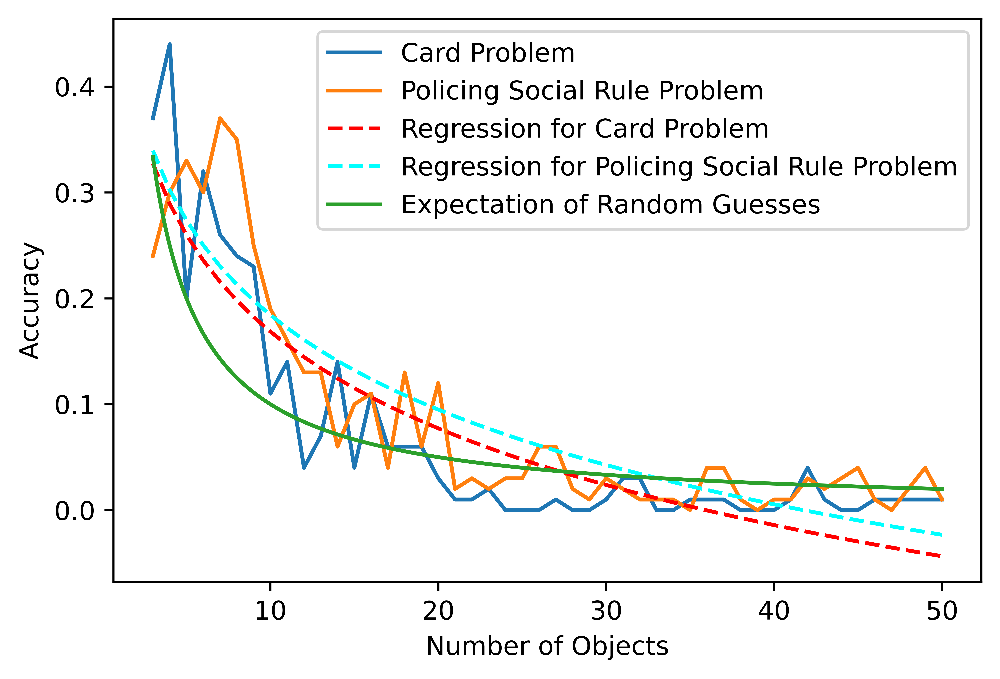

In [110]:
# Produce a figure examining the relationship between n and accuracy

lower_n = 3
upper_n = 50
n_total_tests = ntests * ntests_single 

# Import package
from scipy.optimize import curve_fit

def card_alcohol_accuracy_plot(lower_n, upper_n, ntests):
    card_accuracy_list = []
    alcohol_accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'paired_card_and_alcohol_problem_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        card_cat_df = pd.Categorical(df['Card Correctness'], categories=categories)
        card_acc_for_n = Fraction(card_cat_df.value_counts()[True], ntests)
        card_accuracy_list.append(card_acc_for_n)
        alcohol_cat_df = pd.Categorical(df['Alcohol Correctness'], categories=categories)
        alcohol_acc_for_n = Fraction(alcohol_cat_df.value_counts()[True], ntests)
        alcohol_accuracy_list.append(alcohol_acc_for_n)

    x_value = list(range(lower_n, upper_n+1))
    plt.figure(dpi = 1200)
    plt.plot(x_value, card_accuracy_list, label='Card Problem')
    plt.plot(x_value, alcohol_accuracy_list, label='Policing Social Rule Problem')
    plt.xlabel("Number of Objects")
    plt.ylabel("Accuracy")
    plt.legend()   

card_alcohol_accuracy_plot(lower_n, upper_n, n_total_tests)

def card_alcohol_read(lower_n, upper_n, ntests):
    card_accuracy_list = []
    alcohol_accuracy_list = []
    for i in range(lower_n, upper_n+1):
        file_name = 'paired_card_and_alcohol_problem_' + str(i) + "_with_" + model_id + ".csv"
        df = pd.read_csv(file_name)
        categories = [True, False]
        card_cat_df = pd.Categorical(df['Card Correctness'], categories=categories)
        card_acc_for_n = card_cat_df.value_counts()[True]/ntests
        card_accuracy_list.append(card_acc_for_n)
        alcohol_cat_df = pd.Categorical(df['Alcohol Correctness'], categories=categories)
        alcohol_acc_for_n = alcohol_cat_df.value_counts()[True]/ntests
        alcohol_accuracy_list.append(alcohol_acc_for_n)

    x_value = list(range(lower_n, upper_n+1))

    return x_value, card_accuracy_list, alcohol_accuracy_list


x_value, y1_value, y2_value = card_alcohol_read(lower_n, upper_n, n_total_tests)

regression_data = pd.DataFrame(list(zip(x_value, y1_value, y2_value)),columns =['x', 'card', 'alcohol'])
regression_data.to_csv('card_alcohol_regression_data.csv')


x_value_array = np.array(x_value)
power_regression_start = [-12, 0, 13]
# Power regression with costant
def func(x,a,b,c):
    return a * x**b + c

coeff,var=curve_fit(func,x_value,y1_value, p0= power_regression_start, maxfev=8000)
a, b, c = coeff
print(f'The power regression with constant has result {a} N^({b}) + {c}.')
y_pow_reg1 = func(x_value_array, a, b, c)
plt.plot(x_value, y_pow_reg1, c = 'r', linestyle='dashed', label='Regression for Card Problem')

coeff,var=curve_fit(func,x_value,y2_value, p0= power_regression_start, maxfev=8000)
a, b, c = coeff
print(f'The power regression with constant has result {a} N^({b}) + {c}.')
y_pow_reg2 = func(x_value_array, a, b, c)
plt.plot(x_value, y_pow_reg2, c = 'cyan', linestyle='dashed', label='Regression for Policing Social Rule Problem')

# For power regression with constant
power1_summation = 0
for i in range(len(x_value)):  #looping through each element of the list
    power1_difference = y1_value[i] - y_pow_reg1[i]  #finding the difference between observed and predicted value
    power1_squared_difference = power1_difference**2  #taking square of the differene 
    power1_summation += power1_squared_difference  #taking a sum of all the differences
power1_MSE = power1_summation/len(x_value)  #dividing summation by total values to obtain average

power2_summation = 0
for i in range(len(x_value)):  #looping through each element of the list
    power2_difference = y2_value[i] - y_pow_reg2[i]  #finding the difference between observed and predicted value
    power2_squared_difference = power2_difference**2  #taking square of the differene 
    power2_summation += power2_squared_difference  #taking a sum of all the differences
power2_MSE = power2_summation/len(x_value)  #dividing summation by total values to obtain average

print(power1_MSE)
print(power2_MSE)

# relation_accuracy_plot(lower_n, upper_n, n_total_tests)
x = np.linspace(lower_n, upper_n, (upper_n-lower_n) * 10)
plt.plot(x, 1/x, label='Expectation of Random Guesses')
# plt.plot(x, 2/x, label='2/n')
plt.legend()
# plt.title("Card and Alcohol Problem Accuracy")
plt.savefig('Card and Alcohol Problem Accuracy.png')